In [212]:
import os
import torch
import yaml
import glob
import torchvision.transforms as transforms
from PIL import Image
import numpy as np

In [213]:
def set_seed(seed):
    torch.manual_seed(seed)
    np.random.seed(seed)

    # for cuda
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

In [214]:
set_seed(0)

In [215]:
def extract_files():
    import google.colab
    import zipfile

    google.colab.drive.mount('/content/drive')
    PROJECT_DIR = "/content/drive/MyDrive/thesis/data/"

    zip_ref = zipfile.ZipFile(PROJECT_DIR + "fiveK.zip", 'r')
    zip_ref.extractall(".")
    zip_ref.close()

In [216]:
if 'google.colab' in str(get_ipython()):
  extract_files()
  config_path = "/content/drive/MyDrive/thesis/config.yaml"
else:
  config_path = "../../config.yaml"

In [217]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [218]:
try:
    # Load configuration
    with open(config_path, 'r') as config_file:
        config = yaml.safe_load(config_file)
except:
    raise FileNotFoundError(f"Config file not found at path: {config_path}")

In [219]:
loss_type = config['unetmodel']['loss']
depth = config['unetmodel']['depth']
lambda_ = config['unetmodel']['contrastive_lambda']
base_checkpoint_path = f"{config['paths']['unetcheckpoints']}_{loss_type}_{depth}_{lambda_}"

In [220]:
def load_best_checkpoint(checkpoint_dir):
    # Check if the directory exists
    if not os.path.exists(base_checkpoint_path):
        print(f"No directory found: {checkpoint_dir}")
        return None
      # Get a list of all checkpoint files in the directory
    checkpoint_files = glob.glob(os.path.join(checkpoint_dir, f'unet_*.pth'))

    # sort the checkpoint files according to the epoch number
    checkpoint_files.sort(key=lambda x: int(x.split('_')[-1].split('.')[0]))

    # Check if any checkpoint files are present
    if not checkpoint_files:
        print(f"No checkpoints found in the directory: {checkpoint_dir}")
        return None

    best_val_loss = float('inf')
    epochs = []
    train_losses = []
    val_losses = []
    for checkpoint_file in checkpoint_files:
        checkpoint = torch.load(checkpoint_file, map_location=torch.device(device))
        epochs.append(checkpoint['epoch'])
        train_losses.append(checkpoint['train_loss'])
        val_losses.append(checkpoint['val_loss'])
        if checkpoint['val_loss'] < best_val_loss:
            best_val_loss = checkpoint['val_loss']
            best_checkpoint = checkpoint

    return best_checkpoint, epochs, train_losses, val_losses

In [221]:
checkpoint, epochs, train_losses, val_losses = load_best_checkpoint(base_checkpoint_path)

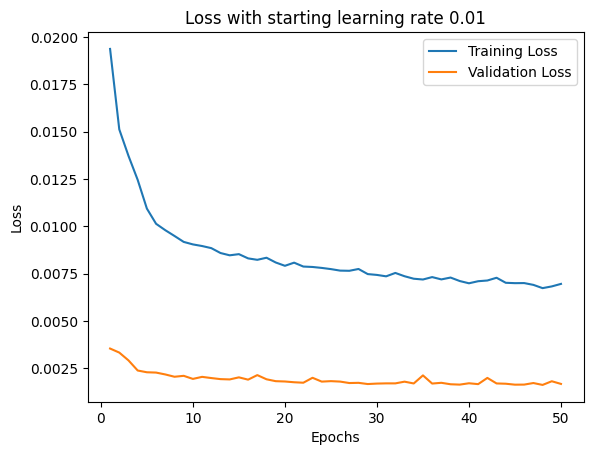

In [222]:
# Draw the plot between epochs and accuracies
import matplotlib.pyplot as plt
plt.plot(epochs, train_losses, label='Training Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss with starting learning rate 0.01')
plt.show()

In [223]:
class ConvBlock(torch.nn.Module):
    def __init__(self, inchannels, outchannels, downscale=False, upscale=False):
        super(ConvBlock, self).__init__()
        self.down = torch.nn.MaxPool2d(2) if downscale else torch.nn.Identity()
        self.conv1 = torch.nn.Conv2d(inchannels, outchannels, 3, padding=1)
        self.bnorm1 = torch.nn.InstanceNorm2d(outchannels)
        self.conv2 = torch.nn.Conv2d(outchannels, outchannels, 3, padding=1)
        self.bnorm2 = torch.nn.InstanceNorm2d(outchannels)
        self.up = torch.nn.Upsample(scale_factor=2) if upscale else torch.nn.Identity()

    def forward(self, x):
        x = self.down(x)
        x = torch.nn.functional.relu(self.bnorm1(self.conv1(x)))
        x = torch.nn.functional.relu(self.bnorm2(self.conv2(x)))
        x = self.up(x)
        return x

In [224]:
class UNet(torch.nn.Module):
    def __init__(self, classes, depth):
        super(UNet, self).__init__()
        self.encoder = torch.nn.ModuleList()
        channels = [3] + [64 * (2 ** i) for i in range(depth)]
        for i in range(depth):
            self.encoder.append(ConvBlock(channels[i], channels[i + 1], downscale=(i > 0)))
        
        self.embedding = torch.nn.Embedding(classes, channels[-1])
        self.bottleneck = ConvBlock(channels[-1], channels[-1], downscale=True, upscale=True)
        
        self.decoder = torch.nn.ModuleList()
        self.linear = torch.nn.ModuleList()
        channels[0] = 64
        for i in range(depth - 1, -1, -1):
            self.decoder.append(ConvBlock(2 * channels[i + 1], channels[i], upscale=(i > 0)))
            self.linear.append(torch.nn.Linear(channels[-1], 2 * channels[i] if i > 0 else channels[i], bias=False))

        self.output = torch.nn.Sequential(
            torch.nn.Conv2d(channels[0], 3, 1),
            torch.nn.Sigmoid()
        )

    def forward(self, x, label):
        skip = []
        for mod in self.encoder:
            x = mod(x)
            skip.append(x)
        emb = self.embedding(label)
        x = x + emb.unsqueeze(-1).unsqueeze(-1)
        x = self.bottleneck(x)
        for mod, linear in zip(self.decoder, self.linear):
            y = skip.pop()
            # add embedding with the decoder input
            x = x + linear(emb).unsqueeze(-1).unsqueeze(-1)
            x = torch.cat([x, y], 1)
            x = mod(x)
        x = self.output(x)
        return x

In [225]:
depth = config['unetmodel']['depth']
net = UNet(classes=2, depth=3)
net = net.to(device)

In [226]:
net.load_state_dict(checkpoint['state_dict'])

<All keys matched successfully>

In [227]:
print(checkpoint['epoch'])

48


In [228]:
print(checkpoint['val_loss'])

0.001627020886167884


In [229]:
classes = ['expB', 'expC']
test_images = ["0120", "0173", "0612", "0001"]

In [230]:
MEAN = [0.2279, 0.2017, 0.1825]
STD = [0.1191, 0.1092, 0.1088]
raw = torch.Tensor().to(device)
retouched_img = torch.Tensor().to(device)
labels =  torch.Tensor().type(torch.int).to(device)

for test_image in test_images:
  for cls in classes:
    raw_img_path = os.path.join(config['paths']['data'], 'raw', test_image + '.png')
    retouched_img_path = os.path.join(config['paths']['data'], cls, test_image + '.png')
    test_tr = transforms.Compose([
          transforms.ToTensor(),
          transforms.CenterCrop(224),
          transforms.Normalize(mean=MEAN, std=STD)
    ])
    raw = torch.cat((raw, test_tr(Image.open(raw_img_path)).unsqueeze(0)))
    retouched_img = torch.cat((retouched_img, test_tr(Image.open(retouched_img_path)).unsqueeze(0)))
    labels = torch.cat((labels, torch.tensor([classes.index(cls)])))

with torch.no_grad():
  net.eval()
  outputs = net(raw, labels)

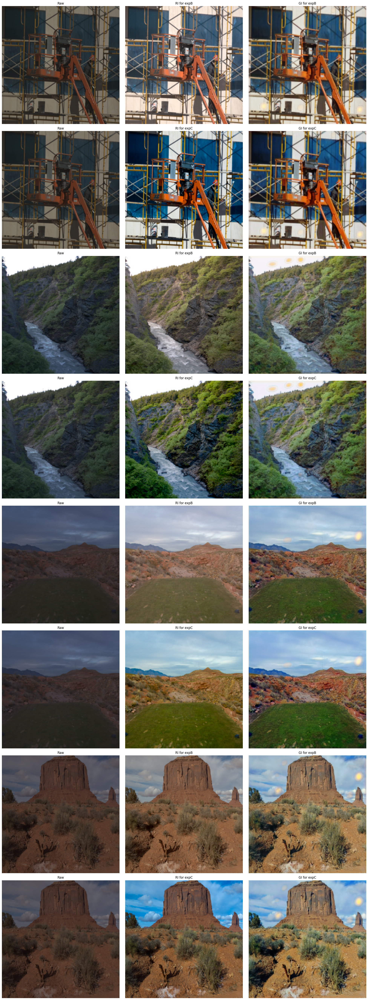

In [231]:
rows = len(test_images) * len(classes)
fig, axes = plt.subplots(rows, 3, figsize=(20, 53)) 
row = 0
for r_img, label, re_img, gi in zip(raw, labels, retouched_img, outputs):
    unnormalized_raw_img = r_img.permute(1, 2, 0) * torch.tensor(STD) + torch.tensor(MEAN)
    unnormalized_retouched_img = re_img.permute(1, 2, 0) * torch.tensor(STD) + torch.tensor(MEAN)
    
    axes[row, 0].imshow(unnormalized_raw_img.numpy().clip(0, 1))
    axes[row, 0].set_title('Raw')

    axes[row, 1].imshow(unnormalized_retouched_img.numpy().clip(0, 1))
    axes[row, 1].set_title(f'RI for {classes[label]}')

    axes[row, 2].imshow(gi.permute(1, 2, 0).cpu().numpy().clip(0, 1))
    axes[row, 2].set_title(f'GI for {classes[label]}')
    row += 1

for ax in axes.flatten():
    ax.axis('off')
    
plt.tight_layout()
plt.show()